In [1]:
import numpy as np
import torch 
import seaborn as sns
import cv2
import os
import pandas as pd
from tqdm import tqdm
from datetime import datetime
from time import time
import matplotlib.pyplot as plt
from utils import big_image_predict, imp_cont_img_file, preprocess_image
from mpl_toolkits import mplot3d

In [2]:
true_results = {
    5 : {
        1 : 1.48,
        2 : 2.74, 
        3 : 2.86,
        4 : 2.52,
        5 : 3.16,
        6 : 1.36,
        7 : 2.98,
        8 : 1.79,
        9 : 2.81,
        11 : 2.57,
        12 : 2.80,
        13 : 2.40,
        14 : 2.44,
        18 : 2.29,
        19 : 2.64,
        20 : 3.28,
    },
    16 : {
        1 : 1.94,
        2 : 1.89,
        3 : 2.89,
        4 : 2.62,
        5 : 1.12,
        6 : 3.86,
        7 : 2.72,
        8 : 2.84,
        9 : 2.37,
        10 : 0.29,
        11 : 2.14,
        12 : 3.17,
        13 : 3.04,
        14 : 2.94,
        15 : 2.40,
        16 : 2.35,
        17 : 3.09,
        18 : 2.80,
        19 : 2.38,
        20 : 0.22,
        21 : 1.01,
        22 : 4.36,
        23 : 2.64,
        24 : 1.83,
        25 : 2.50,
        26 : 2.44,
        27 : 2.31,
        28 : 2.68,
        29 : 2.96,
        30 : 0.15,
    }
}

In [3]:
path = 'asbest/transporter/2020.03.16/'
files = os.listdir(path)
files.sort()
files = [file for file in files if os.path.isfile(os.path.join(path, file))]

# Анализ абсолютно черного кадра

In [4]:
black_files = [file for file in files if file.split('/')[-1].split('_')[0] == 'BLACK']

<Figure size 432x288 with 0 Axes>

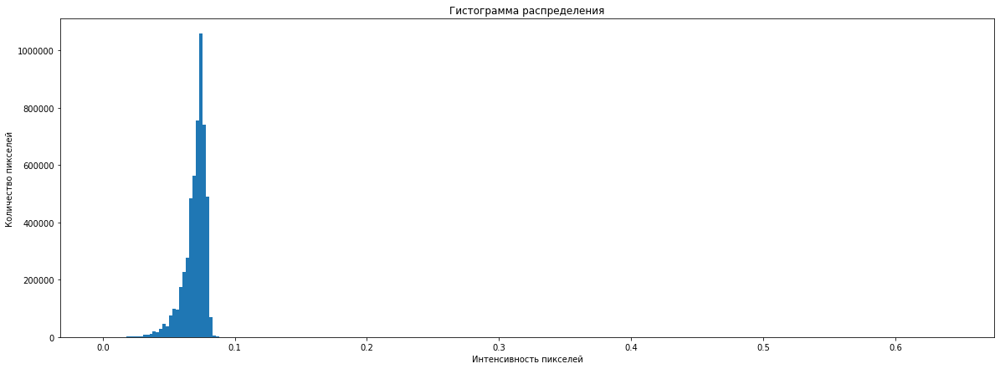

In [5]:
fig = plt.figure()

img = cv2.imread(os.path.join(path, black_files[0]), cv2.IMREAD_UNCHANGED)
mean_black = np.zeros(img.shape, dtype=float)
for file in black_files:
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED) / 255
    mean_black += img
mean_black /= len(black_files)
plt.figure(figsize=(20,7))
# plt.subplot(121)
# plt.imshow(mean_black)
# # ax = plt.axes(projection="3d")

# x = range(mean_black.shape[1])
# y = range(mean_black.shape[0])

# X, Y = np.meshgrid(x, y)
# Z = mean_black
# ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
#                 cmap='winter', edgecolor='none')
# ax.set_title('surface');
# plt.subplot(122)
plt.hist(mean_black.ravel(), bins = 255);
plt.title('Гистограмма распределения')
plt.xlabel('Интенсивность пикселей')
plt.ylabel('Количество пикселей')
plt.savefig('graphics/black_hist.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [6]:
arr = mean_black.ravel()
arr.sort()
arr[-20:]

array([0.09388235, 0.09396078, 0.09411765, 0.09443137, 0.0945098 ,
       0.0947451 , 0.0947451 , 0.09552941, 0.09647059, 0.09827451,
       0.09937255, 0.10368627, 0.10517647, 0.1052549 , 0.11152941,
       0.1134902 , 0.58862745, 0.60447059, 0.61929412, 0.6427451 ])

## Анализ гистограмм

In [7]:
# path_05 = 'asbest/transporter/2020.03.05/'
# path_16 = 'asbest/transporter/2020.03.16/'
def get_time(file):
    return datetime.strptime(file.split('_')[1] + '_' + file.split('_')[2], '%H:%M:%S_%d-%m-%Y')

def get_clip_limit(file):
    data = get_time(file)
    sample = file.split('_')[0]
    if date.day == 16:
        clip_limit = 1.1
    elif date.day == 5 and int(sample) <= 4:
        clip_limit = 1.1
    elif date.day == 5 and int(sample) >= 13:
        clip_limit = 2.5
    elif date.day == 5 and int(sample) >= 5 and int(sample) <= 12:
        clip_limit = 3.0
    return clip_limit


data = []
true = []
info = []
path = 'asbest/tr_stones/'
for file in tqdm(os.listdir(path), total=len(os.listdir(path))):
    full_file_path = os.path.join(path, file)
    if file.endswith('png'):
        date = get_time(file)
        sample = file.split('_')[0]
        if date.day in true_results.keys():
            if int(sample) in true_results[date.day].keys():
                true.append(true_results[date.day][int(sample)])
            else:
                true.append(0)
        else:
            true.append(0)
        img = imp_cont_img_file(full_file_path)
        data.append(img.ravel())
        if len(sample) == 1:
            sample = '0' + sample
        info.append(str(date.day) + '_' + sample)
data = np.array(data)
info = np.array(info)
true = np.array(true)
key = np.argsort(info)
data = data[key]
info = info[key]
true = true[key]

100%|██████████| 135/135 [00:13<00:00, 10.03it/s]


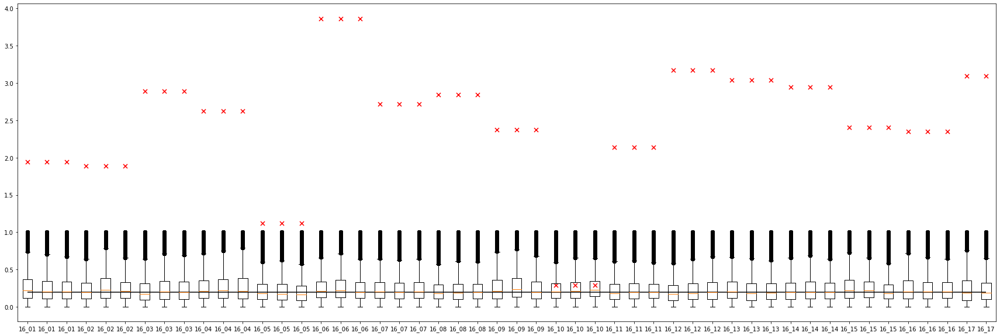

In [8]:
plt.figure(figsize=(30,10))
plt.boxplot(list(data)[:50], labels=info[:50]);
plt.scatter(np.arange(1,51),true[:50], s=50, c='r', marker='x')
plt.hlines(0.20, 1, 50)

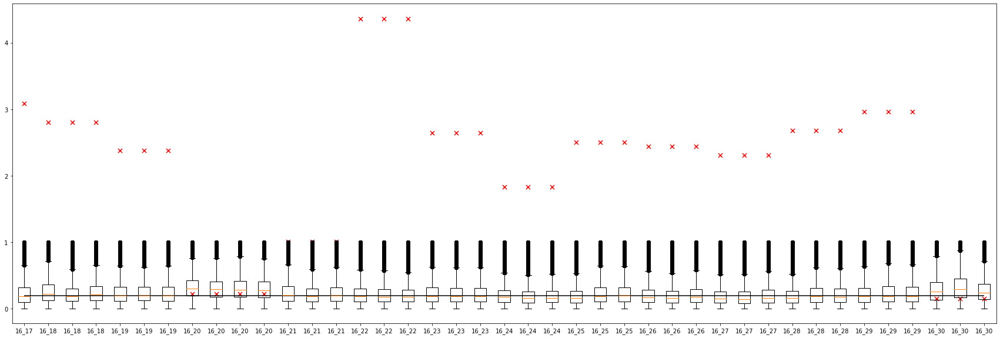

In [9]:
plt.figure(figsize=(30,10))
plt.boxplot(list(data)[50:91], labels=info[50:91]);
plt.scatter(np.arange(1,len(true[50:91])+1),true[50:91], s=50, c='r', marker='x')
plt.hlines(0.20, 1, 41)

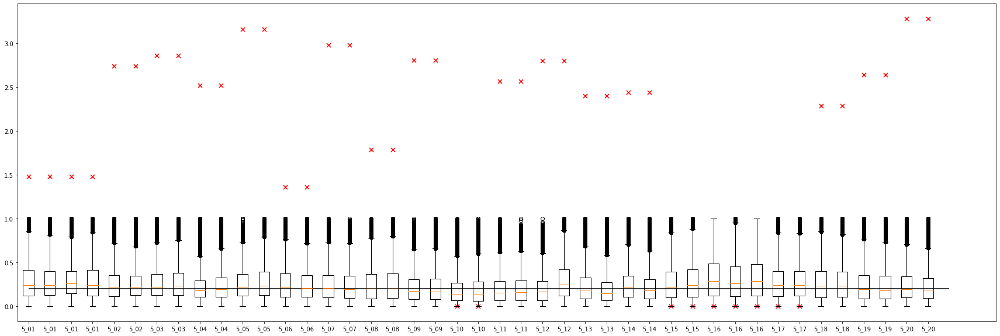

In [10]:
plt.figure(figsize=(30,10))
plt.boxplot(list(data)[91:], labels=info[91:]);
plt.scatter(np.arange(1,len(true[91:])+1),true[91:], s=50, c='r', marker='x')
plt.hlines(0.2, 1, 44)

# Повышение контраста кадров

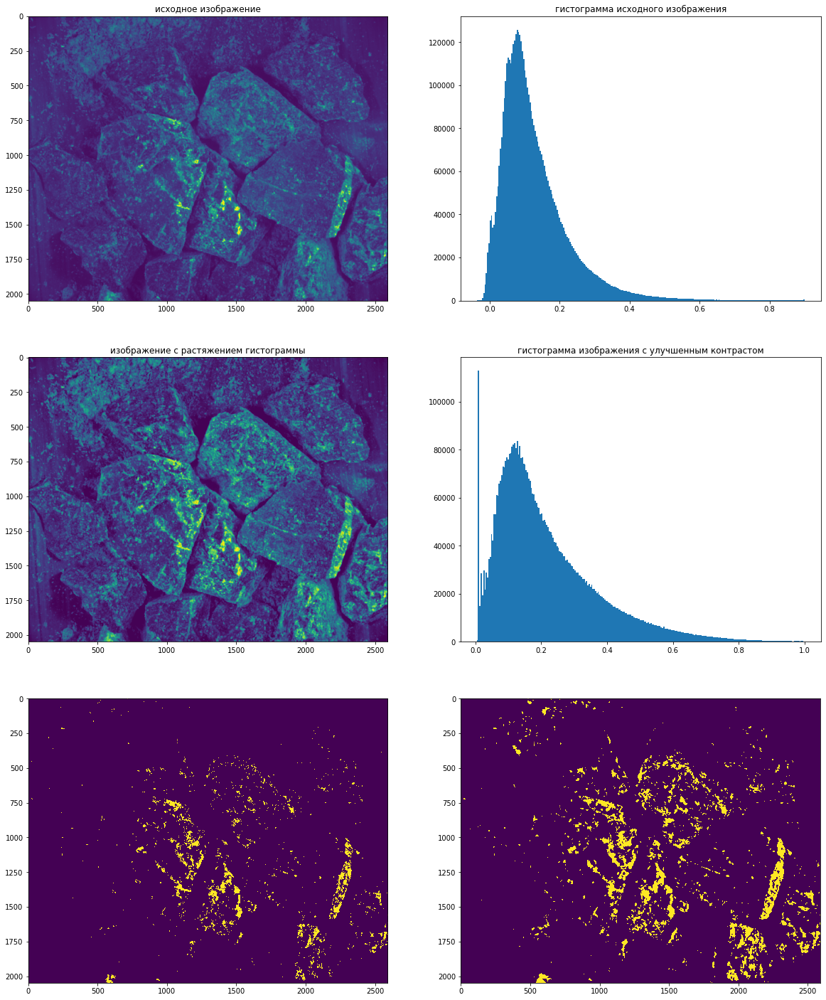

In [80]:
threshold = 0.5
file = 'asbest/transporter/2020.03.16/22_13:21:36_16-03-2020_0.png'
# file = 'asbest/transporter/2020.03.16/20_12:23:59_16-03-2020_0.png'
img = cv2.imread(file, cv2.IMREAD_UNCHANGED).astype(float) / 255
img_blur = cv2.medianBlur(img.astype(np.float32), 5)
img_blur = cv2.GaussianBlur(img_blur, (7,7), 3)
img_cont = preprocess_image(img_blur, clip_limit=1.2, tile=(16,16))

plt.figure(figsize=(20,25))
plt.subplot(321)
plt.imshow(img_blur)
plt.title('исходное изображение')
plt.subplot(322)
plt.hist(img_blur.ravel(), bins = 255);
plt.title('гистограмма исходного изображения')
plt.subplot(323)
plt.imshow(img_cont)
plt.title('изображение с растяжением гистограммы')
plt.subplot(324)
plt.hist(img_cont.ravel(), bins = 255);
plt.title('гистограмма изображения с улучшенным контрастом')
plt.subplot(325)
plt.imshow(img > threshold)
plt.subplot(326)
plt.imshow(img_cont > threshold)
# plt.savefig('graphics/contrast_image.png', dpi=100, bbox_inches='tight', pad_inches=0)

# Удельная интенсивность свечения камней

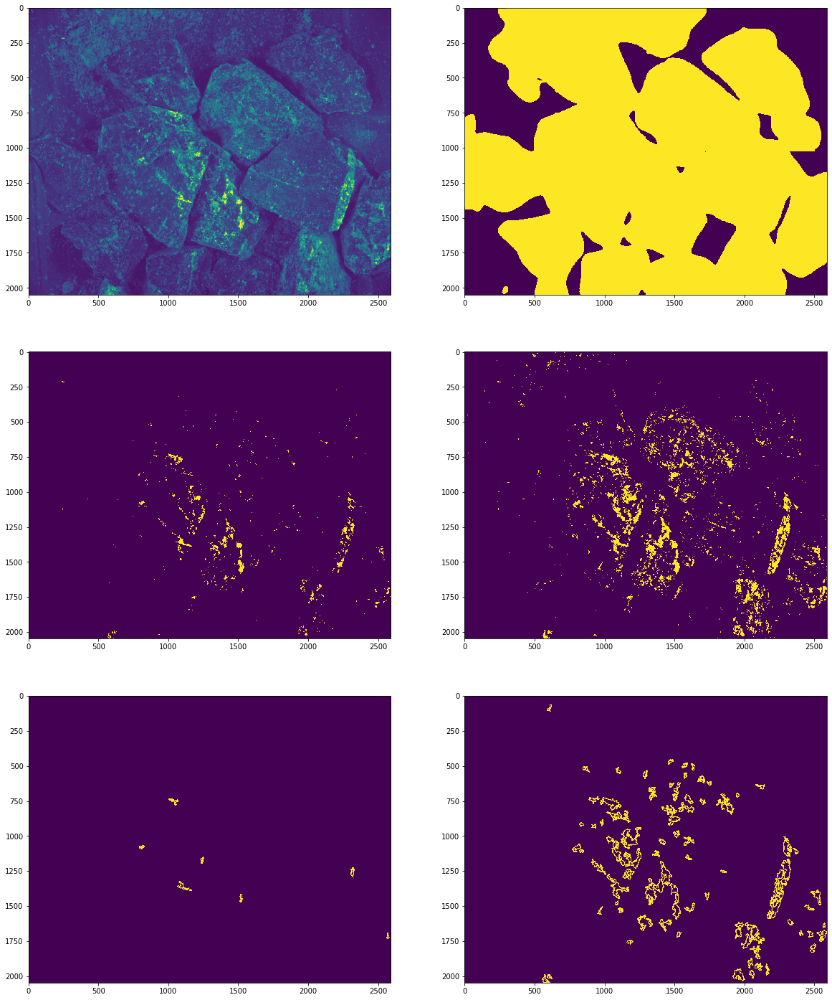

In [83]:
# from utils import preprocess_image
threshold = 0.5
min_area = 300
circle_coef = 0.3
img = cv2.imread('asbest/transporter/2020.03.16/22_13:21:36_16-03-2020_0.png', cv2.IMREAD_UNCHANGED).astype(float) / 255
_, msk = big_image_predict(torch.load('stone_segmentation.pth'), img, crop_size = (img.shape[1] // 2, img.shape[0] // 2), inp_size = (448,448))
plt.figure(figsize=(20,25))
plt.subplot(321)
plt.imshow(img)
plt.subplot(322)
plt.imshow(msk > 0.95)
plt.subplot(323)
plt.imshow(img > threshold)
plt.subplot(324)
img_cont = preprocess_image(img, clip_limit=1.5, tile=(8,8))
plt.imshow(img_cont > threshold)
plt.subplot(325)
# plt.savefig('graphics/stone_segmentation.png', dpi=100, bbox_inches='tight', pad_inches=0)
cnts, hierarchy = cv2.findContours((img > threshold).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
big_cnts = []
for cnt in cnts:
    area = cv2.contourArea(cnt)
    _, radius = cv2.minEnclosingCircle(cnt)
#     cv2.
    if area > min_area and area / np.pi / radius ** 2 < circle_coef:
        big_cnts.append(cnt)
bw = np.zeros(img.shape, dtype=np.uint8)
cv2.drawContours(bw, big_cnts, -1, 255, 5, 1)
plt.imshow(bw * (msk > 0.95))
plt.subplot(326)
# plt.savefig('graphics/stone_segmentation.png', dpi=100, bbox_inches='tight', pad_inches=0)
cnts, hierarchy = cv2.findContours((img_cont > threshold).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
big_cnts = []
for cnt in cnts:
    area = cv2.contourArea(cnt)
    _, radius = cv2.minEnclosingCircle(cnt)
#     cv2.
    if area > min_area: #and area / np.pi / radius ** 2 < circle_coef:
        big_cnts.append(cnt)
bw = np.zeros(img.shape, dtype=np.uint8)
cv2.drawContours(bw, big_cnts, -1, 255, 5, 1)
plt.imshow(bw * (msk > 0.95))

# Сравнение в одной пробе разные перевороты

In [17]:
sample = 15
path = 'asbest/transporter/2020.03.16/'
files_comp = [file for file in files if file.split('_')[0] == str(sample) and (file.split('_')[-1].split('.')[0] == '2' or file.split('_')[-1].split('.')[0] == '21')]
# plt.figure(figsize=(20, 20))
for it, file in enumerate(files_comp):
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED)
    image, msk = big_image_predict(torch.load('stone_segmentation.pth'), img, crop_size = (img.shape[1] // 4, img.shape[0] // 4), inp_size = (448,448))
    
    img_cont = img.copy().astype(float) / 255
    img_cont -= 0.1
    img_cont = np.clip(img_cont / img_cont.max(), 0, 1)
    img_cont[msk < 0.95] = 0
    img_cont = cv2.medianBlur(img_cont.astype(np.float32), 5)
    img_cont = cv2.GaussianBlur(img_cont, (11,11), 3)

    print('Сумма по яркости камней: ', img_cont.sum())
    print('Площадь камней: ', (msk > 0.95).sum())
    print('Удельное свечение: ', img_cont.sum() / (msk > 0.5).sum())
#     plt.subplot(len(files_comp), 2, 2 * it + 1)
#     plt.imshow(img)
#     plt.subplot(len(files_comp), 2, 2 * it + 2)
#     plt.imshow(img_cont)

Сумма по яркости камней:  835068.6
Площадь камней:  4309405
Удельное свечение:  0.19304575155088533
Сумма по яркости камней:  831329.0
Площадь камней:  4242944
Удельное свечение:  0.19524632989395815
Сумма по яркости камней:  970745.0
Площадь камней:  4258077
Удельное свечение:  0.22728634973081385
Сумма по яркости камней:  971858.4
Площадь камней:  4217952
Удельное свечение:  0.229556215219055
Сумма по яркости камней:  704779.3
Площадь камней:  4122102
Удельное свечение:  0.17037923123059817
Сумма по яркости камней:  707689.9
Площадь камней:  4203058
Удельное свечение:  0.16772239236177933


# Удаление шумов

Сумма по яркости камней:  706237.0


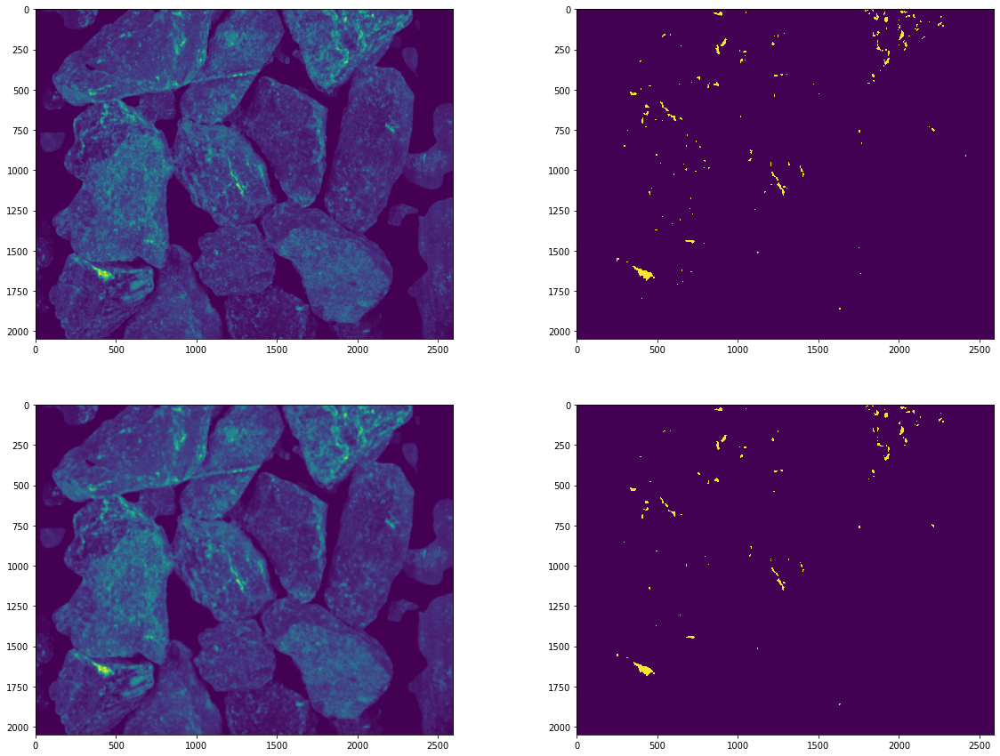

In [18]:
thresh = 0.5
img_blur = cv2.medianBlur(img_cont.astype(np.float32), 5)
plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img_blur)
plt.subplot(222)
plt.imshow(img_blur > thresh)
img_blur = cv2.GaussianBlur(img_blur, (11,11), 5)
plt.subplot(223)
plt.imshow(img_blur)
plt.subplot(224)
plt.imshow(img_blur > thresh)
print('Сумма по яркости камней: ', img_blur.sum())

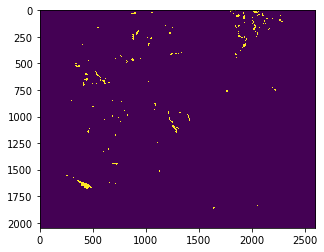

In [19]:
img_blur = cv2.medianBlur(img_cont.astype(np.float32), 3)
plt.imshow(img_blur > 0.5)

In [20]:
name_frame = []
for file in files:
    tmp = file.split('_')
    try:
        if int(tmp[0]):
            name_frame.append(file)
    except:
        pass

def get_time(file_name):
    return datetime.strptime(file_name.split('_')[1] + '_' + file_name.split('_')[2], '%H:%M:%S_%d-%m-%Y')

In [ ]:
path = 'asbest/transporter/2020.03.16/'
data = {'sample' : [], 
        'subsample' : [], 
        'true' : [], 
        'stone_area' : [],
        'stone_brightness' : [], 
        'binary_threshold_0.5' : [],
        'binary_threshold_0.6' : [],
        'binary_threshold_0.7' : [],
        'binary_threshold_0.8' : [],
        'binary_threshold_0.9' : [],
        'intensity_threshold_0.5' : [],
        'intensity_threshold_0.6' : [],
        'intensity_threshold_0.7' : [],
        'intensity_threshold_0.8' : [],
        'intensity_threshold_0.9' : [],
        'long_lines_threshold_0.5' : [],
        'long_lines_threshold_0.6' : [],
        'long_lines_threshold_0.7' : [],
        'long_lines_threshold_0.8' : [],
        'long_lines_threshold_0.9' : [],
        
       }
subsample = 0

model_load = torch.load('stone_segmentation.pth').to('cuda:0')
model_load.eval();
# clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(10,10))
top_threshes = [0.5, 0.6, 0.7, 0.8, 0.9] 
flag_start = True
for it, file in tqdm(enumerate(files), total=len(files)):
    try:
        if flag_start:
            sample = int(file.split('_')[0])
            time = get_time(file)
            flag_start = False
        int(file.split('_')[0])
    except:
        continue                  
                            
    
    if sample != int(file.split('_')[0]):
        sample = int(file.split('_')[0])
        subsample = 0
        time = get_time(file)

    if (get_time(file) - time).seconds > 10:
        subsample += 1
        time = get_time(file)
        
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED)
    _, msk = big_image_predict(model_load, img, crop_size = (img.shape[1] // 2, img.shape[0] // 2), inp_size = (448,448))
    msk = msk > 0.9
    img[msk == False] = 0
    
    img = img.astype(float) / 255

    if sample in true_results[time.day].keys():
        data['true'].append(true_results[time.day][sample])
    else:
        data['true'].append(0)
        
    stone_area = msk.sum()    
    data['sample'].append(sample)
    data['subsample'].append(subsample)
    data['stone_area'].append(stone_area)
    data['stone_brightness'].append(img.sum() / stone_area)
    for threshold in top_threshes:
        data['binary_threshold_' + str(threshold)].append((img > threshold).astype(float).sum() / stone_area)
        data['intensity_threshold_' + str(threshold)].append(img[img > threshold].sum() / stone_area)
        cnts, hierarchy = cv2.findContours((img > threshold).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        area_asbest = 0
        for cnt in cnts:
            area = cv2.contourArea(cnt)
            _, radius = cv2.minEnclosingCircle(cnt)
            if area > 200 and area / np.pi / radius ** 2 < 0.25:
                area_asbest += area
        data['long_lines_threshold_' + str(threshold)].append(area_asbest / stone_area)

 36%|███▋      | 1707/4700 [15:44<49:06,  1.02it/s]

In [45]:
df = pd.DataFrame(data)

In [46]:
df.head(5)

,sample,subsample,true,stone_area,stone_brightness,binary_threshold_0.5,binary_threshold_0.6,binary_threshold_0.7,binary_threshold_0.8,binary_threshold_0.9,intensity_threshold_0.5,intensity_threshold_0.6,intensity_threshold_0.7,intensity_threshold_0.8,intensity_threshold_0.9,long_lines_threshold_0.5,long_lines_threshold_0.6,long_lines_threshold_0.7,long_lines_threshold_0.8,long_lines_threshold_0.9
0,10,0,0.29,4296245,0.266544,0.023534,0.006015,0.001833,0.000592,0.000184,0.013557,0.004119,0.001440,0.000520,0.000177,0.002800,0.000616,0.000457,0.000082,0.0
1,10,0,0.29,4296245,0.266544,0.023534,0.006015,0.001833,0.000592,0.000184,0.013557,0.004119,0.001440,0.000520,0.000177,0.002800,0.000616,0.000457,0.000082,0.0
2,10,0,0.29,4348575,0.265316,0.021178,0.005267,0.001606,0.000508,0.000158,0.012172,0.003604,0.001260,0.000446,0.000151,0.002388,0.000575,0.000420,0.000082,0.0
3,10,0,0.29,4296405,0.265994,0.023719,0.006074,0.001856,0.000596,0.000181,0.013669,0.004162,0.001458,0.000523,0.000173,0.002415,0.000853,0.000421,0.000082,0.0
4,10,0,0.29,4329769,0.265319,0.023858,0.006134,0.001880,0.000617,0.000195,0.013756,0.004204,0.001478,0.000542,0.000187,0.002667,0.000657,0.000466,0.000084,0.0


In [47]:
df.to_csv('data.csv')

# Анализ

In [48]:
df = pd.read_csv('data.csv', index_col=0)
df.head(5)

,sample,subsample,true,stone_area,stone_brightness,binary_threshold_0.5,binary_threshold_0.6,binary_threshold_0.7,binary_threshold_0.8,binary_threshold_0.9,intensity_threshold_0.5,intensity_threshold_0.6,intensity_threshold_0.7,intensity_threshold_0.8,intensity_threshold_0.9,long_lines_threshold_0.5,long_lines_threshold_0.6,long_lines_threshold_0.7,long_lines_threshold_0.8,long_lines_threshold_0.9
0,10,0,0.29,4296245,0.266544,0.023534,0.006015,0.001833,0.000592,0.000184,0.013557,0.004119,0.001440,0.000520,0.000177,0.002800,0.000616,0.000457,0.000082,0.0
1,10,0,0.29,4296245,0.266544,0.023534,0.006015,0.001833,0.000592,0.000184,0.013557,0.004119,0.001440,0.000520,0.000177,0.002800,0.000616,0.000457,0.000082,0.0
2,10,0,0.29,4348575,0.265316,0.021178,0.005267,0.001606,0.000508,0.000158,0.012172,0.003604,0.001260,0.000446,0.000151,0.002388,0.000575,0.000420,0.000082,0.0
3,10,0,0.29,4296405,0.265994,0.023719,0.006074,0.001856,0.000596,0.000181,0.013669,0.004162,0.001458,0.000523,0.000173,0.002415,0.000853,0.000421,0.000082,0.0
4,10,0,0.29,4329769,0.265319,0.023858,0.006134,0.001880,0.000617,0.000195,0.013756,0.004204,0.001478,0.000542,0.000187,0.002667,0.000657,0.000466,0.000084,0.0


## Площадь камней

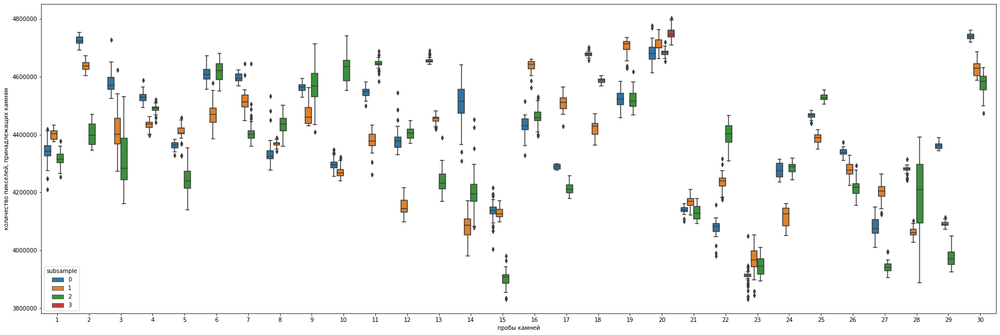

In [49]:
plt.figure(figsize=(30,10))
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
sns.boxplot(x='sample', y='stone_area', data=df_show, hue='subsample')
plt.xlabel('пробы камней')
plt.ylabel('количество пикселей, принадлежащих камням')
# plt.ylim(0,1)
# plt.xlim(-1,5)
plt.savefig('graphics/results_stone_area_with_subsample.png', dpi=100, bbox_inches='tight', pad_inches=0)

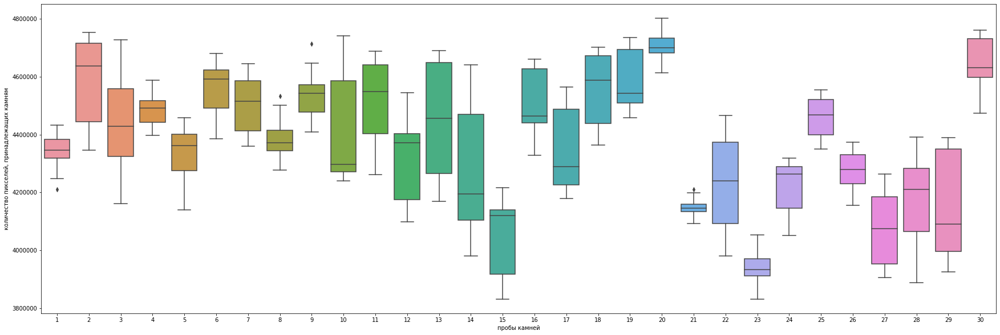

In [50]:
plt.figure(figsize=(30,10))
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
sns.boxplot(x='sample', y='stone_area', data=df_show)
plt.xlabel('пробы камней')
plt.ylabel('количество пикселей, принадлежащих камням')
# plt.ylim(0,1)
# plt.xlim(-1,5)
plt.savefig('graphics/results_stone_area_without_subsample.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [51]:
df_calc = df_show.groupby(['sample']).quantile(0.75) - df_show.groupby(['sample']).quantile(0.25)
df_calc['stone_area'] > 400000


sample
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
Name: stone_area, dtype: bool

## Удельная интенсивность камней

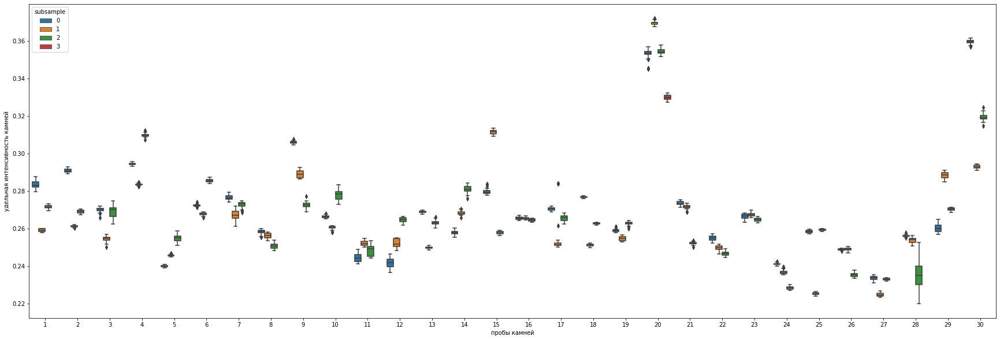

In [52]:
plt.figure(figsize=(30,10))
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
sns.boxplot(x='sample', y='stone_brightness', data=df_show, hue='subsample')
plt.xlabel('пробы камней')
plt.ylabel('удельная интенсивность камней')
# plt.ylim(0,1)
# plt.xlim(-1,5)
plt.savefig('graphics/results_stone_brightness.png', dpi=100, bbox_inches='tight', pad_inches=0)

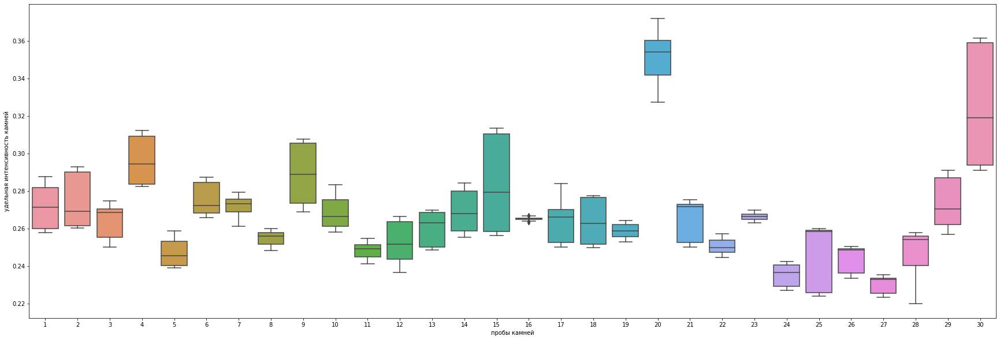

In [53]:
plt.figure(figsize=(30,10))
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
sns.boxplot(x='sample', y='stone_brightness', data=df_show)
plt.xlabel('пробы камней')
plt.ylabel('удельная интенсивность камней')
# plt.ylim(0,1)
# plt.xlim(-1,5)
plt.savefig('graphics/results_stone_brightness_without_sabsamples.png', dpi=100, bbox_inches='tight', pad_inches=0)

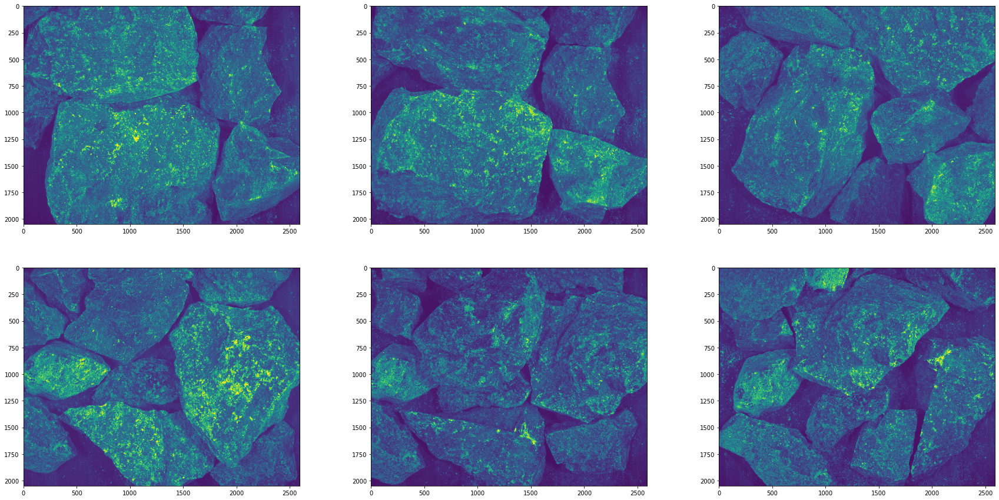

In [54]:
file_show = [file for file in files if file.split('_')[0] in ['20', '30'] and file.split('_')[-1] == '20.png']
plt.figure(figsize=(30,15))
for it in range(1,7):
    plt.subplot(2, 3, it)
    plt.imshow(cv2.imread(os.path.join(path, file_show[it]), cv2.IMREAD_UNCHANGED))
plt.savefig('graphics/20_30_samples.png', dpi=100, bbox_inches='tight', pad_inches=0)

## Пороговая оценка

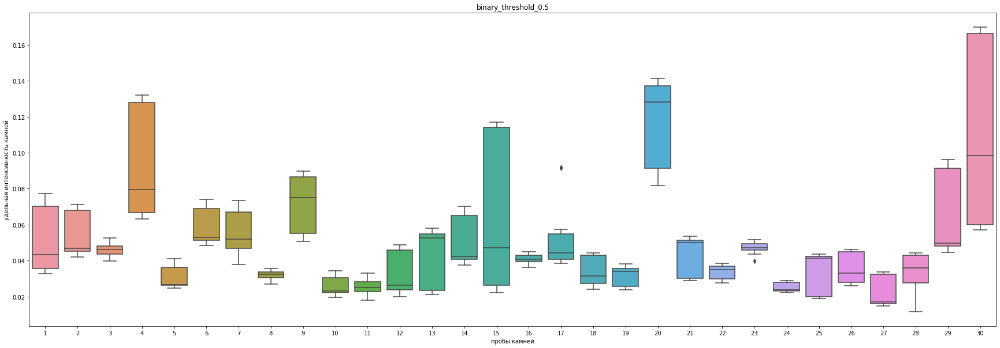

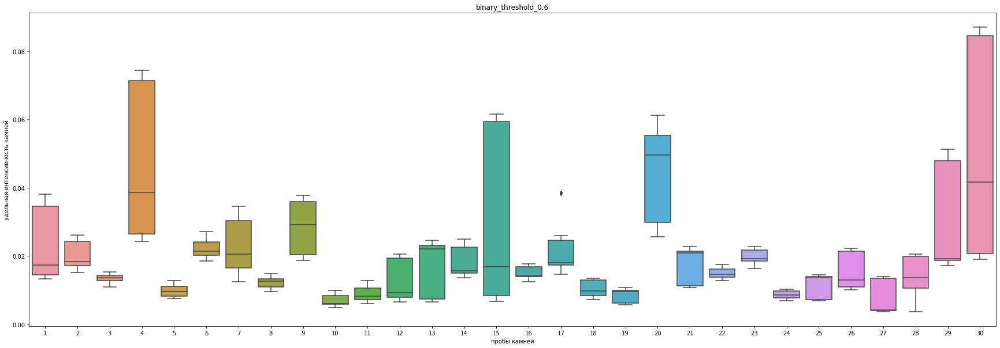

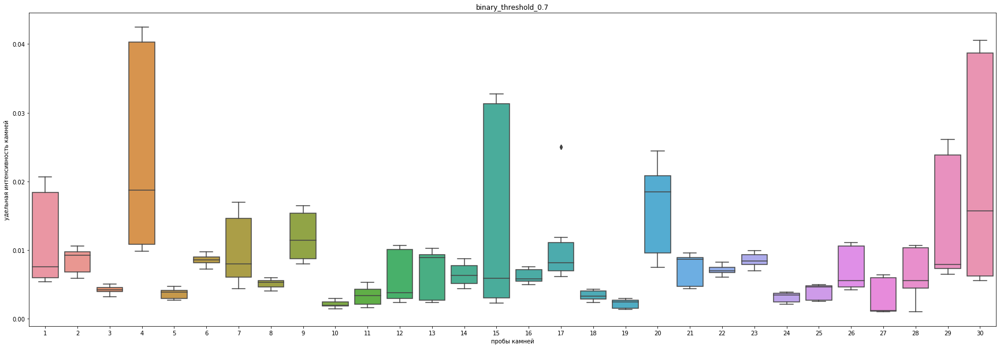

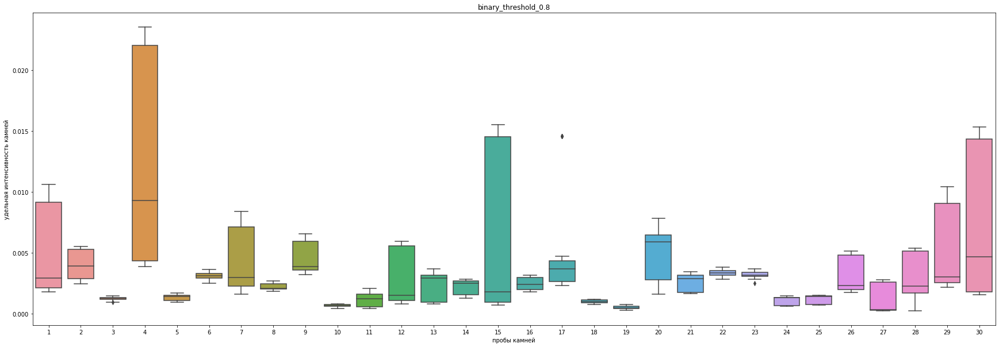

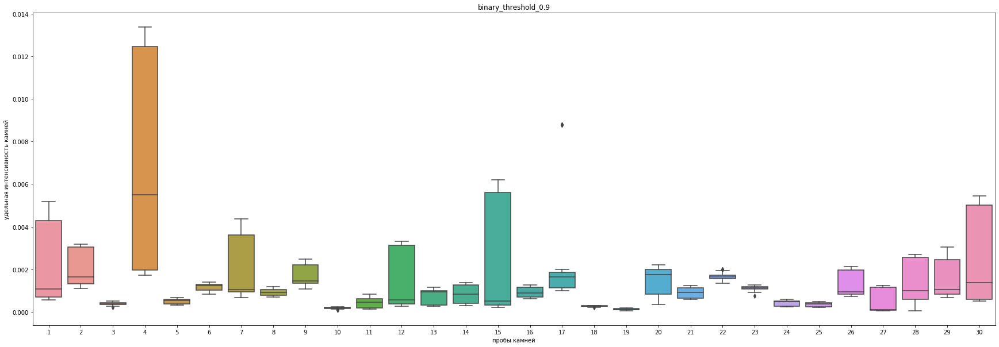

In [55]:
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
for column in df_show.columns:
    if column.find('binary_threshold') >= 0:
        plt.figure(figsize=(30,10))
        sns.boxplot(x='sample', y=column, data=df_show)
        plt.title(column)
        plt.xlabel('пробы камней')
        plt.ylabel('удельная интенсивность камней')
# plt.ylim(0,1)
# plt.xlim(-1,5)
        plt.savefig('graphics/' + column + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

## Удельная пороговая яркость

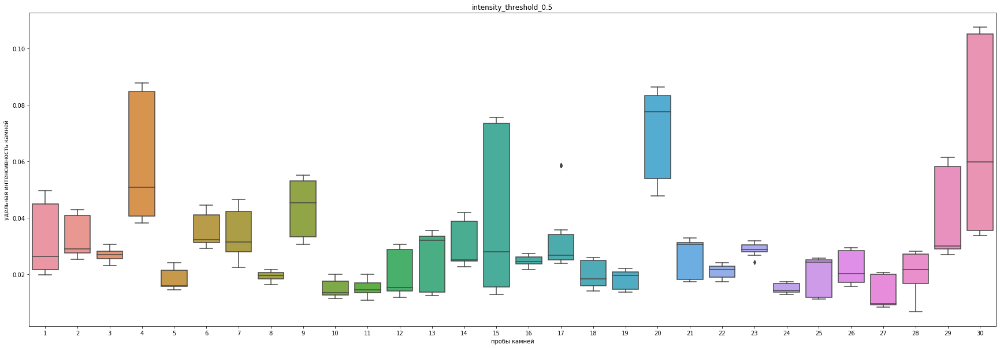

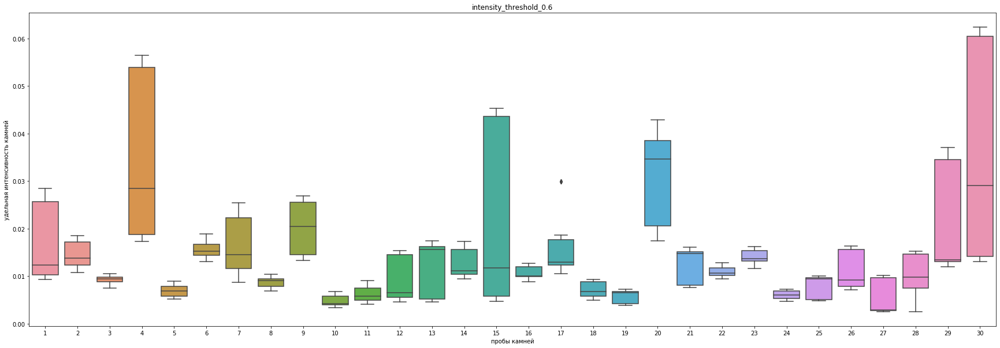

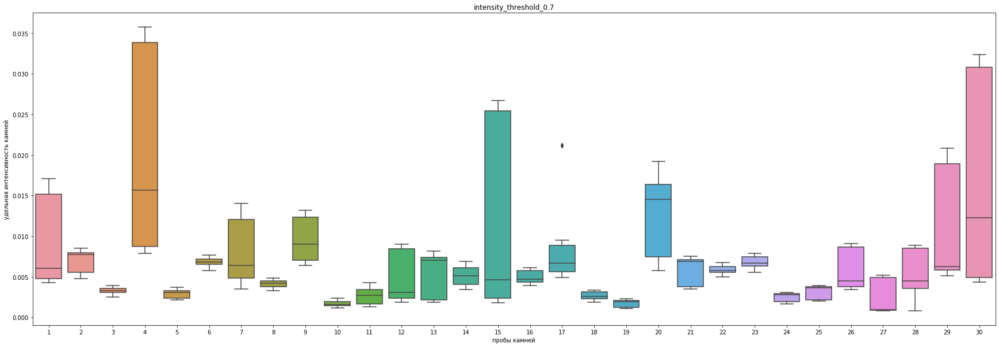

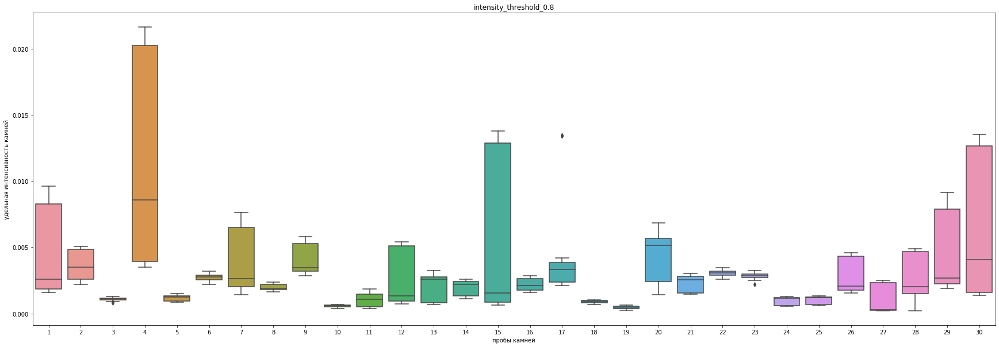

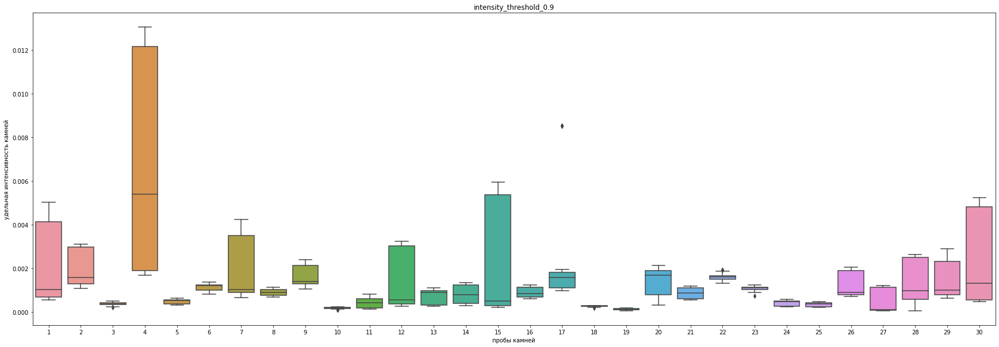

In [56]:
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
for column in df_show.columns:
    if column.find('intensity_threshold') >= 0:
        plt.figure(figsize=(30,10))
        sns.boxplot(x='sample', y=column, data=df_show)
        plt.title(column)
        plt.xlabel('пробы камней')
        plt.ylabel('удельная интенсивность камней')
# plt.ylim(0,1)
# plt.xlim(-1,5)
        plt.savefig('graphics/' + column + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

# Зависимости

## Яркость камней

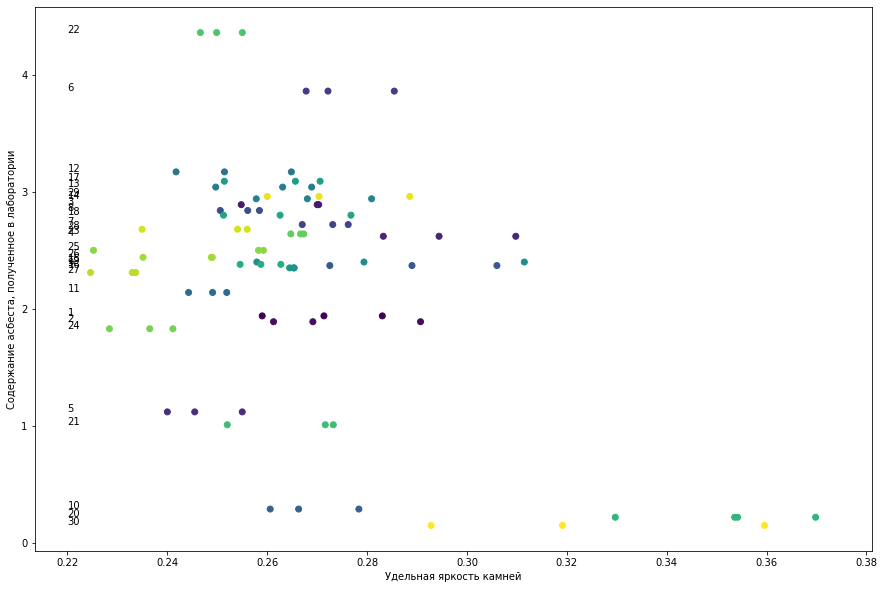

In [57]:
df_show = df.groupby(['sample', 'subsample'], as_index=False, group_keys=False).median()
df_show = df_show[df_show['true'] > 0]
plt.figure(figsize=(15,10))
plt.scatter(df_show['stone_brightness'], df_show['true'], c = df_show['sample'])
tmp = []
for i, p in enumerate(np.array(df_show['sample'])):
    if p not in tmp:
        plt.annotate((p), (0.22, np.array(df_show['true'])[i]))
        tmp.append(p)
plt.xlabel('Удельная яркость камней')
plt.ylabel('Содержание асбеста, полученное в лаборатории')
plt.savefig('graphics/brightness_stone_TO_asbest.png', dpi=100, bbox_inches='tight', pad_inches=0.1)

## Пороговое содержание асбеста

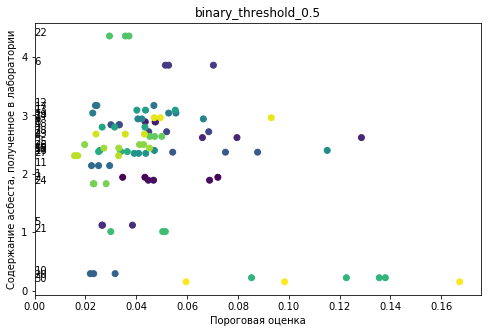

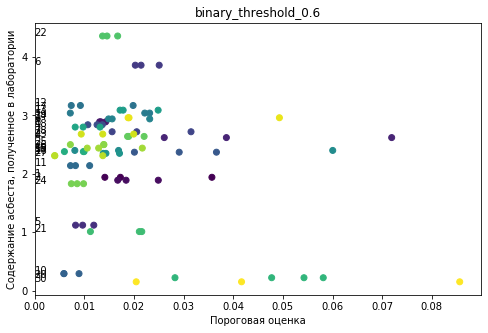

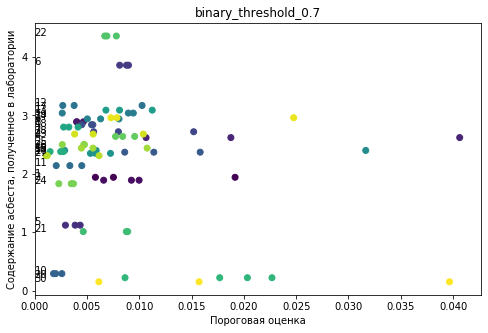

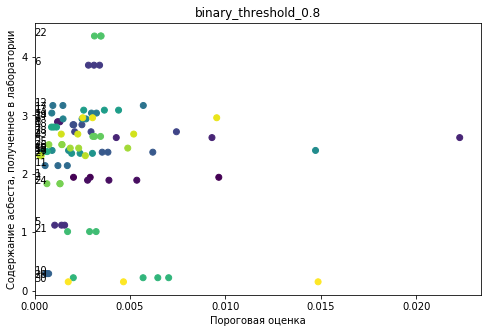

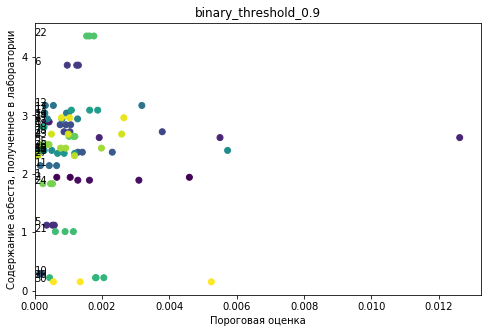

In [58]:
df_show = df.groupby(['sample', 'subsample'], as_index=False, group_keys=False).median()
df_show = df_show[df_show['true'] > 0]
for column in [column for column in df_show.columns if column.find('binary_threshold') >= 0]:
    plt.figure(figsize=(8,5))
    plt.scatter(df_show[column], df_show['true'], c = df_show['sample'])
    tmp = []
    for i, p in enumerate(np.array(df_show['sample'])):
        if p not in tmp:
            plt.annotate((p), (0, np.array(df_show['true'])[i]))
            tmp.append(p)
    plt.title(column)
    plt.xlim((0, df_show[column].max() * 1.05))
    plt.xlabel('Пороговая оценка')
    plt.ylabel('Содержание асбеста, полученное в лаборатории')
    plt.savefig('graphics/' + column + '_TO_asbest.png', dpi=100, bbox_inches='tight', pad_inches=0.1)

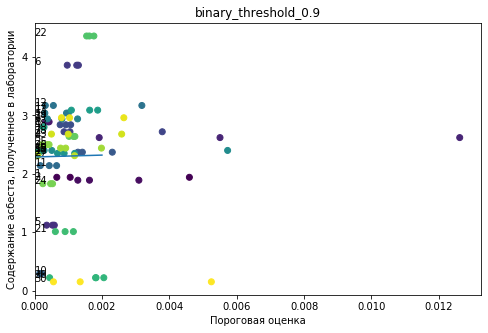

In [59]:
plt.figure(figsize=(8,5))
plt.scatter(df_show['binary_threshold_0.9'], df_show['true'], c = df_show['sample'])
tmp = []
for i, p in enumerate(np.array(df_show['sample'])):
    if p not in tmp:
        plt.annotate((p), (0, np.array(df_show['true'])[i]))
        tmp.append(p)
plt.title(column)
plt.xlim((0, df_show[column].max() * 1.05))
plt.xlabel('Пороговая оценка')
plt.ylabel('Содержание асбеста, полученное в лаборатории')
# plt.savefig('graphics/' + column + '_TO_asbest.png', dpi=100, bbox_inches='tight', pad_inches=0.1)
koef = np.polyfit(df_show['binary_threshold_0.9'], df_show['true'], 1)
x = np.array([0, 0.0020])
y = np.polyval(koef, x)
plt.plot(x, y)

## Удельное пороговое содержание асбеста 

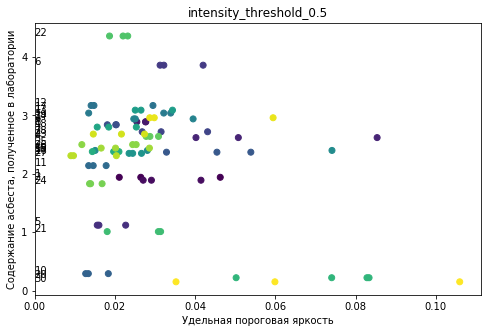

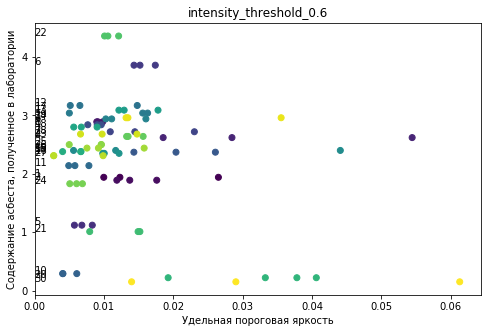

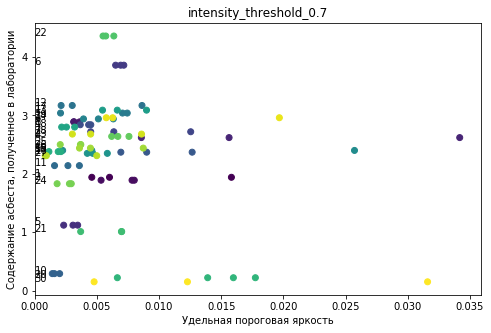

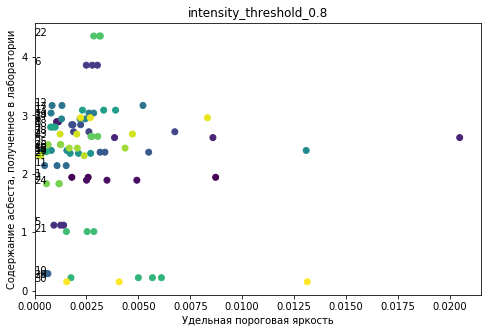

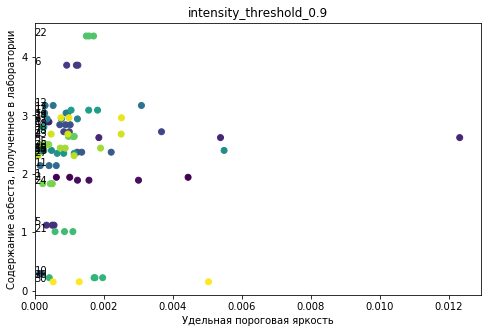

In [63]:
df_show = df.groupby(['sample', 'subsample'], as_index=False, group_keys=False).median()
df_show = df_show[df_show['true'] > 0]
for column in [column for column in df_show.columns if column.find('intensity_threshold') >= 0]:
    plt.figure(figsize=(8,5))
    plt.scatter(df_show[column], df_show['true'], c = df_show['sample'])
    tmp = []
    for i, p in enumerate(np.array(df_show['sample'])):
        if p not in tmp:
            plt.annotate((p), (0, np.array(df_show['true'])[i]))
            tmp.append(p)
    plt.title(column)
    plt.xlim((0, df_show[column].max() * 1.05))
    plt.xlabel('Удельная пороговая яркость')
    plt.ylabel('Содержание асбеста, полученное в лаборатории')
    plt.savefig('graphics/' + column + '_TO_asbest.png', dpi=100, bbox_inches='tight', pad_inches=0.1)

# Удельное содержание асбеста при определении длинных жил

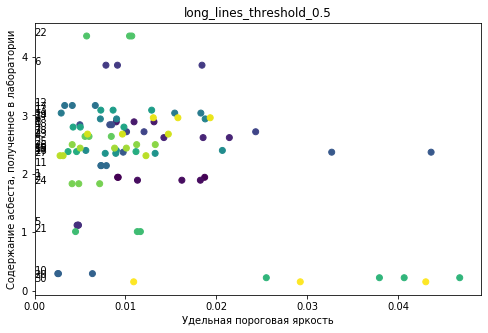

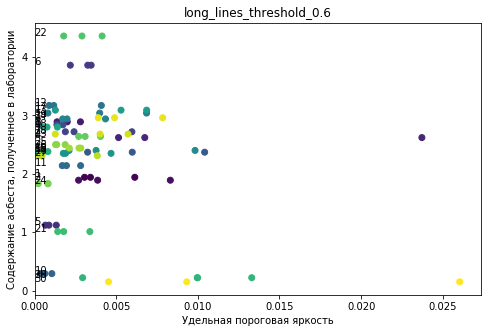

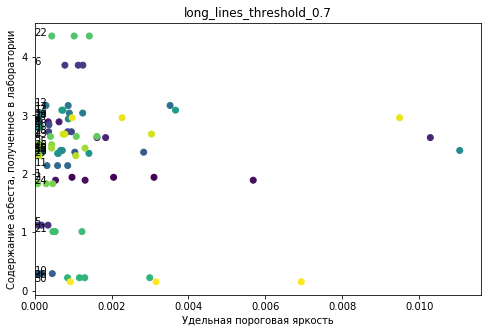

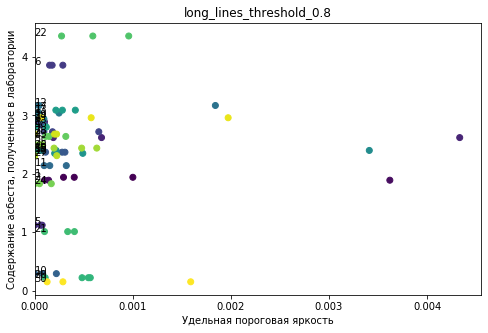

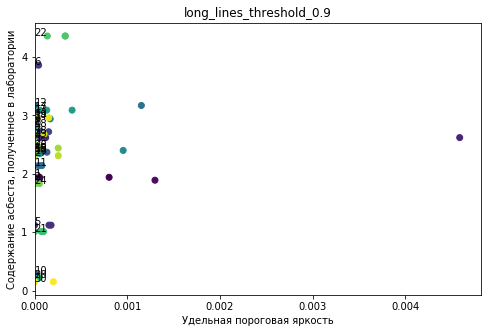

In [64]:
df_show = df.groupby(['sample', 'subsample'], as_index=False, group_keys=False).median()
df_show = df_show[df_show['true'] > 0]
for column in [column for column in df_show.columns if column.find('long_lines_threshold') >= 0]:
    plt.figure(figsize=(8,5))
    plt.scatter(df_show[column], df_show['true'], c = df_show['sample'])
    tmp = []
    for i, p in enumerate(np.array(df_show['sample'])):
        if p not in tmp:
            plt.annotate((p), (0, np.array(df_show['true'])[i]))
            tmp.append(p)
    plt.title(column)
    plt.xlim((0, df_show[column].max() * 1.05))
    plt.xlabel('Удельная пороговая яркость')
    plt.ylabel('Содержание асбеста, полученное в лаборатории')
    plt.savefig('graphics/' + column + '_TO_asbest.png', dpi=100, bbox_inches='tight', pad_inches=0.1)

In [61]:
plt.figure(figsize=(10,7))
plt.title('Порог ' + str(thresh_top))
plt.xlabel('Вычисленное по изображению')
plt.ylabel('Лабораторное')
scatter = plt.scatter(np.array(data['pred']), np.array(data['true']), c=np.array(data['file']), cmap = plt.cm.brg)
# scatter = plt.scatter(np.array(data['pred'])[np.array(data['true']) != 0], np.array(data['true'])[np.array(data['true']) != 0], c=np.array(data['file'])[np.array(data['true']) != 0])
# plt.legend(*scatter.legend_elements(), loc='upper right')
tmp = []
for i, p in enumerate(np.array(data['file'])):
    if p not in tmp:
        plt.annotate((p), (np.array(data['pred'][i]), np.array(data['true'])[i]))
        tmp.append(p)
# plt.scatter(np.array(data['pred'])[np.array(data['true']) == 0], np.array(data['true'])[np.array(data['true']) == 0], c ='r')
# plt.xlim([0,1.7])
plt.ylim([0,3.5])
# x = np.array([0, np.max(data['pred'])])
# k = np.polyfit(data['pred'], data['true'], 1)
# y = k[0] * x + k[1]
# plt.plot(x, y)
plt.savefig('graphics/results_' + str(thresh_top) + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

NameError: name 'thresh_top' is not defined

<Figure size 720x504 with 0 Axes>

In [ ]:
plt.figure(figsize=(30,10))
inter = (0, 30)
# inter = (0, 10)
# inter = (10, 20)
# inter = (20, 30)
df_show = df[(df['sample'] > inter[0]) & (df['sample'] <= inter[1])]
sns.boxplot(x='sample', y='pred', data=df_show, hue='subsample')
plt.ylim(0,5)
# plt.xlim(-1,5)
plt.savefig('graphics/results_' + str(thresh_top) + '_' + str(inter) + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [ ]:
plt.figure(figsize=(10,7))
plt.title('Порог ' + str(thresh_top))
plt.xlabel('Вычисленное по изображению')
plt.ylabel('Лабораторное')
scatter = plt.scatter(np.array(data['pred']), np.array(data['true']), c=np.array(data['file']), cmap = plt.cm.brg)
# scatter = plt.scatter(np.array(data['pred'])[np.array(data['true']) != 0], np.array(data['true'])[np.array(data['true']) != 0], c=np.array(data['file'])[np.array(data['true']) != 0])
# plt.legend(*scatter.legend_elements(), loc='upper right')
tmp = []
for i, p in enumerate(np.array(data['file'])):
    if p not in tmp:
        plt.annotate((p), (np.array(data['pred'][i]), np.array(data['true'])[i]))
        tmp.append(p)
# plt.scatter(np.array(data['pred'])[np.array(data['true']) == 0], np.array(data['true'])[np.array(data['true']) == 0], c ='r')
# plt.xlim([0,1.7])
# plt.ylim([1,3.5])
# x = np.array([0, np.max(data['pred'])])
# k = np.polyfit(data['pred'], data['true'], 1)
# y = k[0] * x + k[1]
# plt.plot(x, y)
# plt.savefig('results_' + str(thresh_top) + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [4]:
true_results = {
    1 : 1.48,
    2 : 2.74, 
    3 : 2.86,
    4 : 2.52,
    5 : 3.16,
    6 : 1.36,
    7 : 2.98,
    8 : 1.79,
    9 : 2.81,
    11 : 2.57,
    12 : 2.80,
    13 : 2.40,
    14 : 2.44,
    18 : 2.29,
    19 : 2.64,
    20 : 3.28
}

name_frame = []
for file in files:
    tmp = file.split('_')
    try:
        if int(tmp[0]) in true_results.keys() and tmp[-1] == '5.png':
            name_frame.append(file)
    except:
        pass
name_frame

['11_12:46:01_05-03-2020_5.png',
 '11_12:46:26_05-03-2020_5.png',
 '12_12:47:59_05-03-2020_5.png',
 '12_12:48:37_05-03-2020_5.png',
 '13_13:55:19_05-03-2020_5.png',
 '13_13:55:42_05-03-2020_5.png',
 '14_13:57:14_05-03-2020_5.png',
 '14_13:57:44_05-03-2020_5.png',
 '18_14:09:21_05-03-2020_5.png',
 '18_14:09:38_05-03-2020_5.png',
 '19_14:11:19_05-03-2020_5.png',
 '19_14:11:45_05-03-2020_5.png',
 '1_12:08:09_05-03-2020_5.png',
 '1_12:08:12_05-03-2020_5.png',
 '1_12:08:55_05-03-2020_5.png',
 '1_12:09:41_05-03-2020_5.png',
 '20_14:14:58_05-03-2020_5.png',
 '20_14:15:24_05-03-2020_5.png',
 '2_12:15:18_05-03-2020_5.png',
 '2_12:16:15_05-03-2020_5.png',
 '3_12:18:23_05-03-2020_5.png',
 '3_12:19:17_05-03-2020_5.png',
 '4_12:26:48_05-03-2020_5.png',
 '4_12:27:14_05-03-2020_5.png',
 '5_12:29:52_05-03-2020_5.png',
 '5_12:30:15_05-03-2020_5.png',
 '6_12:32:19_05-03-2020_5.png',
 '6_12:32:49_05-03-2020_5.png',
 '7_12:34:40_05-03-2020_5.png',
 '7_12:35:02_05-03-2020_5.png',
 '8_12:37:40_05-03-2020_5.

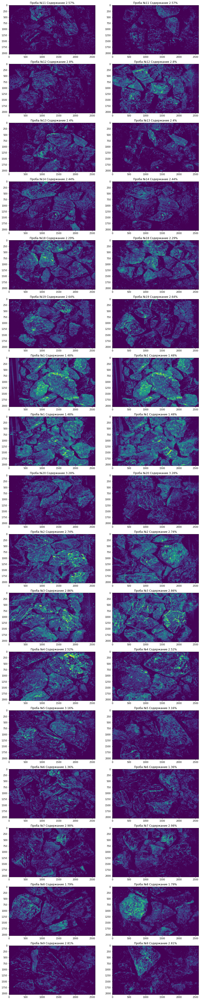

In [20]:
fig = plt.figure(figsize=(15,80), frameon=False)
# ax = plt.Axes(fig, [0., 0., 1., 1.])
# ax.set_axis_off()
# fig.add_axes(ax)

clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(10,10))
for it, file in enumerate(name_frame):
    plt.subplot(len(name_frame) / 2, 2, it+1)
    plt.title('Проба №' + file.split('_')[0] + ' Содержание ' + str(true_results[int(file.split('_')[0])]) + '%')
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED)
    img = img.astype(float) / 255
#     if int(file.split('_')[0]) >= 5:
#         img = np.clip(img * 1.3, 0, 1)
    thresh_bottom = 1 / 6
    img_1 = img.copy()
#     img_1[img_1 < thresh_bottom] = 0
#     stone_area = len(np.where(img_1 > thresh_bottom)[0])

    img_1 -= thresh_bottom
    img_1 = np.clip(img_1 / img_1.max(), 0, 1)
    
    img_2 = clahe.apply((img_1 * 255).astype(np.uint8))
    img_2 = img_2.astype(float) / 255
    thresh_top = 200 / 255
    plt.imshow(img_2, aspect='auto')
plt.savefig('samples_images.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [17]:
# plt.figure(figsize=(15,50))
data = {'true' : [], 'pred' : [], 'file' : []}
for it, file in tqdm(enumerate(files), total=len(files)):
    try:
        int(file.split('_')[0])
    except:
        continue
    
#     if int(file.split('_')[0]) not in true_results.keys():
#         continue
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED)
    img = img.astype(float) / 255
#     if int(file.split('_')[0]) >= 5:
#         img = np.clip(img * 1.3, 0, 1)
    thresh_bottom = 0.2 #1 / 7
    img_1 = img.copy()
#     img_1[img_1 < thresh_bottom] = 0

    img_1 -= thresh_bottom
    img_1 = np.clip(img_1 / img_1.max(), 0, 1)
    
    thresh_top = 0.6 #180 / 255
    img_2 = clahe.apply((img_1 * 255).astype(np.uint8))
    img_2 = img_2.astype(float) / 255
    data['pred'].append(len(np.where(img_2 > thresh_top)[0])/ (img_2.shape[0] * img_2.shape[1]) * 100)
    if int(file.split('_')[0]) in true_results.keys():
        data['true'].append(true_results[int(file.split('_')[0])])
    else:
        data['true'].append(0)
    data['file'].append(int(file.split('_')[0]))

100%|██████████| 445/445 [00:50<00:00,  8.80it/s]


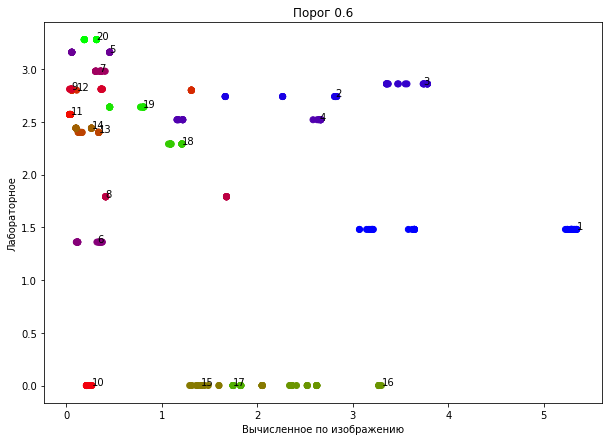

In [18]:
plt.figure(figsize=(10,7))
plt.title('Порог ' + str(thresh_top))
plt.xlabel('Вычисленное по изображению')
plt.ylabel('Лабораторное')
scatter = plt.scatter(np.array(data['pred']), np.array(data['true']), c=np.array(data['file']), cmap = plt.cm.brg)
# scatter = plt.scatter(np.array(data['pred'])[np.array(data['true']) != 0], np.array(data['true'])[np.array(data['true']) != 0], c=np.array(data['file'])[np.array(data['true']) != 0])
# plt.legend(*scatter.legend_elements(), loc='upper right')
tmp = []
for i, p in enumerate(np.array(data['file'])):
    if p not in tmp:
        plt.annotate((p), (np.array(data['pred'][i]), np.array(data['true'])[i]))
        tmp.append(p)
# plt.scatter(np.array(data['pred'])[np.array(data['true']) == 0], np.array(data['true'])[np.array(data['true']) == 0], c ='r')
# plt.xlim([0,1.7])
# plt.ylim([1,3.5])
# x = np.array([0, np.max(data['pred'])])
# k = np.polyfit(data['pred'], data['true'], 1)
# y = k[0] * x + k[1]
# plt.plot(x, y)
plt.savefig('results_' + str(thresh_top) + '.png', dpi=100, bbox_inches='tight', pad_inches=0)

In [35]:
scatter.legend_elements()

([<matplotlib.lines.Line2D at 0x7fee80485cf8>,
 ['$\\mathdefault{2.5}$',
  '$\\mathdefault{5.0}$',
  '$\\mathdefault{7.5}$',
  '$\\mathdefault{10.0}$',
  '$\\mathdefault{12.5}$',
  '$\\mathdefault{15.0}$',
  '$\\mathdefault{17.5}$',
  '$\\mathdefault{20.0}$'])

In [8]:
scatter.legend_elements()

([<matplotlib.lines.Line2D at 0x7f60e96eafd0>,
 ['$\\mathdefault{2.5}$',
  '$\\mathdefault{5.0}$',
  '$\\mathdefault{7.5}$',
  '$\\mathdefault{10.0}$',
  '$\\mathdefault{12.5}$',
  '$\\mathdefault{15.0}$',
  '$\\mathdefault{17.5}$',
  '$\\mathdefault{20.0}$'])

In [92]:
data = {'sample' : [], 'num' : [], 'time' : [], 'substance' : [], 'result' : []}

clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(10,10))
for file in tqdm(files, total=len(files)):
    info = file.split('_')
    
    try:
        sample = int(info[0])
    except:
        sample = info[0]
        
    time = datetime.strptime(info[1] + '_' + info[2], '%H:%M:%S_%d-%m-%Y')
    num = int(info[3].split('.')[0])
    
    img = cv2.imread(os.path.join(path, file), cv2.IMREAD_UNCHANGED)
    thresh_bottom = 40
    img_1 = img.copy()
    img_1[img_1 < thresh_bottom] = 0
    stone_area = len(np.where(img_1 > thresh_bottom)[0])
    
    thresh_top = 200
    img_2 = clahe.apply(img_1)
#     img_2[img_2 < thresh_top] = 0
    substance = len(np.where(img_2 > thresh_top)[0]) / stone_area
    
    data['sample'].append(sample)
    data['time'].append(time)
    data['num'].append(num)
    data['substance'].append(substance)
    if sample in results.keys():
        data['result'].append(results[sample])
    else:
        data['result'].append(None)
        
#     break

100%|██████████| 445/445 [00:41<00:00, 10.81it/s]


In [94]:
df = pd.DataFrame(data=data)

In [95]:
df[df['sample'] == 9]

,sample,num,time,substance,result
410,9,0,2020-03-05 12:39:56,0.000371,2.81
411,9,1,2020-03-05 12:39:56,0.000371,2.81
412,9,2,2020-03-05 12:39:56,0.000371,2.81
413,9,3,2020-03-05 12:39:56,0.000371,2.81
414,9,4,2020-03-05 12:39:56,0.000371,2.81
415,9,5,2020-03-05 12:39:57,0.000371,2.81
416,9,6,2020-03-05 12:39:57,0.000375,2.81
417,9,7,2020-03-05 12:39:57,0.000413,2.81
418,9,8,2020-03-05 12:39:57,0.000403,2.81
419,9,9,2020-03-05 12:39:57,0.000395,2.81


In [268]:
name_frame

['2_12:15:18_05-03-2020_5.png',
 '2_12:16:15_05-03-2020_5.png',
 '3_12:18:23_05-03-2020_5.png',
 '3_12:19:17_05-03-2020_5.png',
 '4_12:26:48_05-03-2020_5.png',
 '4_12:27:14_05-03-2020_5.png',
 '5_12:29:52_05-03-2020_5.png',
 '5_12:30:15_05-03-2020_5.png',
 '6_12:32:19_05-03-2020_5.png',
 '6_12:32:49_05-03-2020_5.png',
 '7_12:34:40_05-03-2020_5.png',
 '7_12:35:02_05-03-2020_5.png',
 '8_12:37:40_05-03-2020_5.png',
 '8_12:38:09_05-03-2020_5.png',
 '9_12:39:57_05-03-2020_5.png',
 '9_12:40:23_05-03-2020_5.png']

2


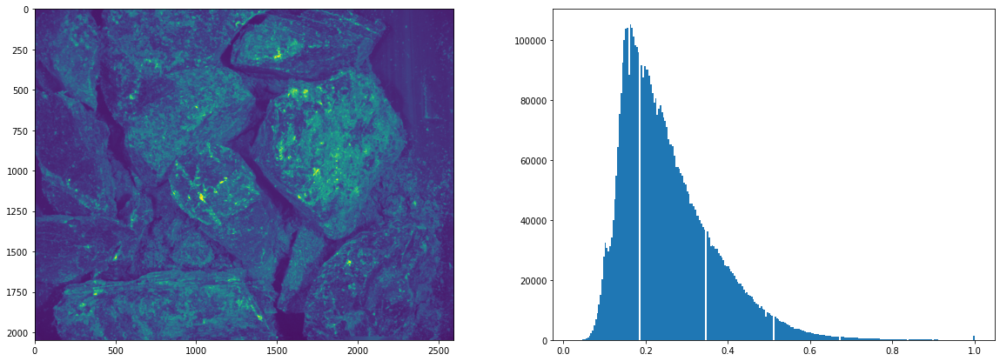

In [278]:
index = 1
print(name_frame[index].split('/')[-1].split('_')[0])
img = cv2.imread(os.path.join(path, name_frame[index]), cv2.IMREAD_UNCHANGED)
img = img.astype(float) / 255
plt.figure(figsize=(20,7))
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.hist(img.ravel(), bins = 255);


6


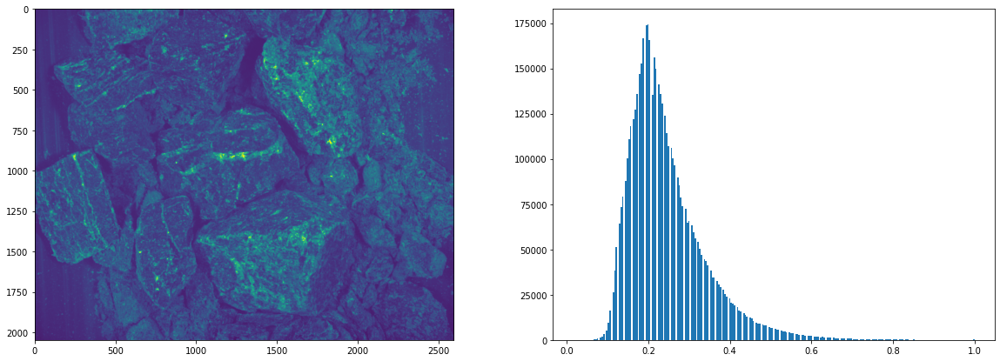

In [287]:
index = 9
print(name_frame[index].split('/')[-1].split('_')[0])
img = cv2.imread(os.path.join(path, name_frame[index]), cv2.IMREAD_UNCHANGED)
img = np.clip(img.astype(float) / 255 * 1.3, 0, 1)
plt.figure(figsize=(20,7))
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.hist(img.ravel(), bins = 255);

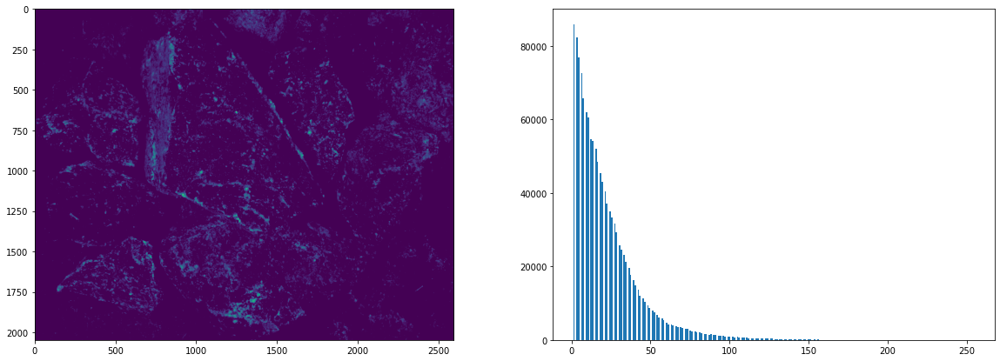

In [187]:
thresh_bottom = 50
img_1 = img.copy()
img_1[img_1 < thresh_bottom] = 0
stone_area = len(np.where(img_1 > thresh_bottom)[0])

img_1[img_1 >= thresh_bottom] -= thresh_bottom
img_1 = (img_1 / img_1.max() * 255).astype(np.uint8)

plt.figure(figsize=(20,7))
plt.subplot(121)
plt.imshow(img_1)
plt.subplot(122)
plt.hist(img_1.ravel(), bins = 255, range=[1,255]);

In [188]:
# thresh_top = 100
len(sum(img_1) / 255) / stone_area
# len(np.where(img_1 > thresh_top)[0]) / stone_area

0.0019106928030571085

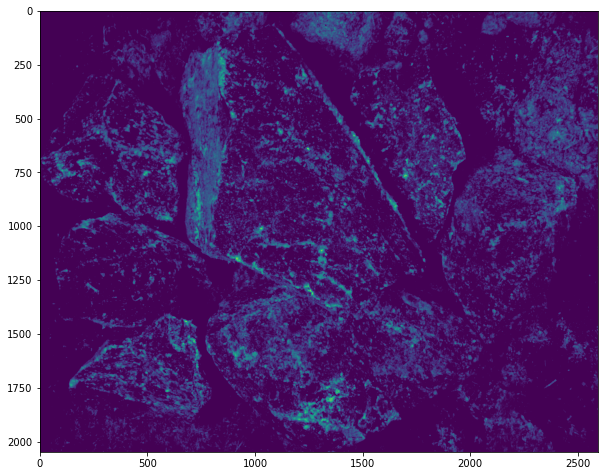

In [180]:

# clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(10,10))
# img_2 = clahe.apply(img_1)
# img_2[img_2 < thresh_top] = 0
plt.figure(figsize=(10,10))
plt.imshow(img_2)

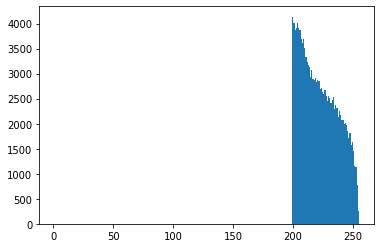

In [62]:
plt.hist(img_2.ravel(), bins = 255, range=[1,255]);